## Checking Bias in the data ##

### Results: ###
### Western / US authors have the highest share among authors in the dataset. ###
### Most readers report that they are located in Western countries / USA ###

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
%run import_data_.py

Unzipping to update your data folder...
Data folder updated successfully
Goodreads dataset loaded successfully as books_goodreads
Pandas dataframes (books_goodreads, books_big, book, users, ratings) loaded successfully
Columns in DataFrames 'users' and 'ratings' renamed
You can use the DataFrames 'books' or 'books_big' - they are exactly the same (big) dataset
loading books_ratings and books_users_ratings
Ready to go!


In [3]:
all_cleaned = pd.read_csv('../data/all_cleaned.csv')
all_cleaned.head()

,isbn,book_title,book_author,year_of_publication,publisher,genre,user_id,book_rating,location,age,age_numeric,age_bins,mod_book_author,mod_book_title,mod_publisher,country
0,068160204X,The Royals,Kitty Kelley,2020,Bausch & Lombard,unknown,16634.0,0.0,"little rock, arkansas, usa",42.0,42.0,Adult,kitty kelley,the royals,bausch lombard,usa
1,068160204X,The Royals,Kitty Kelley,2020,Bausch & Lombard,unknown,87141.0,0.0,"huntington beach, california, usa",unknown,NaN,unknown,kitty kelley,the royals,bausch lombard,usa
2,068160204X,The Royals,Kitty Kelley,2020,Bausch & Lombard,unknown,169736.0,7.0,"minneapolis, minnesota, usa",34.0,34.0,Adult,kitty kelley,the royals,bausch lombard,usa
3,068160204X,The Royals,Kitty Kelley,2020,Bausch & Lombard,unknown,208406.0,0.0,"kansas city, missouri, usa",30.0,30.0,Adult,kitty kelley,the royals,bausch lombard,usa
4,068160204X,The Royals,Kitty Kelley,2020,Bausch & Lombard,unknown,230496.0,0.0,"simi valley, california, usa",34.0,34.0,Adult,kitty kelley,the royals,bausch lombard,usa


#### The countries are in different languages and a couple of unclean data are still in the list; nevertheless, most readers are located in Western countries ####

In [4]:
print(all_cleaned['country'].value_counts().to_string())

country
usa                        101868
germany                     19263
canada                      13281
spain                        9816
france                       8245
united kingdom               6342
australia                    3052
switzerland                  2992
italy                        1828
portugal                     1786
austria                      1582
netherlands                  1101
malaysia                      850
new zealand                   849
finland                       267
belgium                       250
iran                          229
romania                       197
argentina                     197
brazil                        183
ireland                       175
singapore                     173
sweden                        164
japan                         139
philippines                   125
norway                        105
mexico                         99
china                          95
dominican republic             87
denmar

In [5]:
print(all_cleaned['mod_book_author'].value_counts().to_string())

mod_book_author
john grisham                                                                                              2128
jack canfield                                                                                             1719
j k rowling                                                                                               1205
stephen king                                                                                              1159
nora roberts                                                                                               984
alexander mccall smith                                                                                     971
nick hornby                                                                                                943
debbie macomber                                                                                            861
david guterson                                                                                  

#### the most prevalent book authors are US authors and the most prevalent country is the US  ####

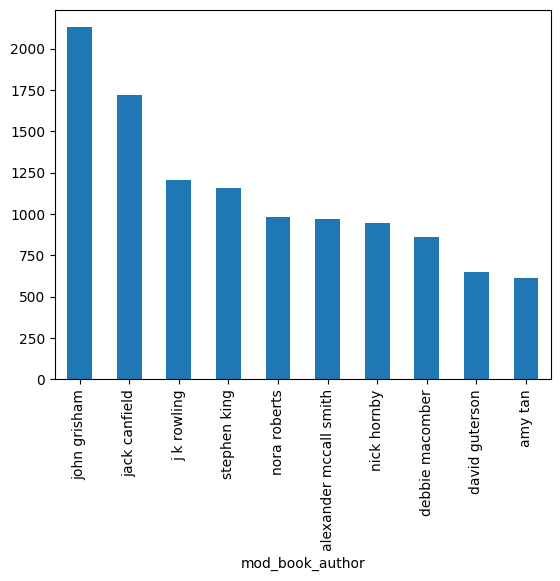

In [6]:
top_authors = all_cleaned['mod_book_author'].value_counts().head(10).plot(kind='bar')

In [7]:
all_cleaned[all_cleaned['mod_book_author'] == 'zev ben shimon halevi']

,isbn,book_title,book_author,year_of_publication,publisher,genre,user_id,book_rating,location,age,age_numeric,age_bins,mod_book_author,mod_book_title,mod_publisher,country
41998,1578632285,THE ANOINTED,Z'Ev Ben Shimon Halevi,2001,Weiser Books,"Fiction, Inquisition, History, Cabala, Jews, F...",216683.0,8.0,"san jose, california, usa",unknown,NaN,unknown,zev ben shimon halevi,the anointed,weiser books,usa


In [8]:
# cleaning data: extracting surname, name from author and removing additional abbreviations 
!pip install nameparser


In [9]:
from nameparser import HumanName

# Function to extract surname and given name
def extract_name_surname(full_name):
    name = HumanName(full_name)
    return f"{name.first} {name.last}"

In [10]:
# Apply the function to create the new column
all_cleaned['name_surname'] = all_cleaned['mod_book_author'].apply(extract_name_surname)
all_cleaned.head()

,isbn,book_title,book_author,year_of_publication,publisher,genre,user_id,book_rating,location,age,age_numeric,age_bins,mod_book_author,mod_book_title,mod_publisher,country,name_surname
0,068160204X,The Royals,Kitty Kelley,2020,Bausch & Lombard,unknown,16634.0,0.0,"little rock, arkansas, usa",42.0,42.0,Adult,kitty kelley,the royals,bausch lombard,usa,kitty kelley
1,068160204X,The Royals,Kitty Kelley,2020,Bausch & Lombard,unknown,87141.0,0.0,"huntington beach, california, usa",unknown,NaN,unknown,kitty kelley,the royals,bausch lombard,usa,kitty kelley
2,068160204X,The Royals,Kitty Kelley,2020,Bausch & Lombard,unknown,169736.0,7.0,"minneapolis, minnesota, usa",34.0,34.0,Adult,kitty kelley,the royals,bausch lombard,usa,kitty kelley
3,068160204X,The Royals,Kitty Kelley,2020,Bausch & Lombard,unknown,208406.0,0.0,"kansas city, missouri, usa",30.0,30.0,Adult,kitty kelley,the royals,bausch lombard,usa,kitty kelley
4,068160204X,The Royals,Kitty Kelley,2020,Bausch & Lombard,unknown,230496.0,0.0,"simi valley, california, usa",34.0,34.0,Adult,kitty kelley,the royals,bausch lombard,usa,kitty kelley


In [11]:
print(all_cleaned['name_surname'].value_counts().to_string())

name_surname
john grisham                                 2128
jack canfield                                1719
j rowling                                    1205
stephen king                                 1160
nora roberts                                  984
alexander smith                               971
nick hornby                                   943
debbie macomber                               861
dean koontz                                   723
david guterson                                647
amy tan                                       616
john irving                                   538
tom clancy                                    510
jonathan kellerman                            508
isabel allende                                492
patricia cornwell                             466
robert waller                                 458
anne tyler                                    433
lavyrle spencer                               431
sebastian junger                     

In [12]:
print(all_cleaned['mod_book_author'].value_counts().to_string())

mod_book_author
john grisham                                                                                              2128
jack canfield                                                                                             1719
j k rowling                                                                                               1205
stephen king                                                                                              1159
nora roberts                                                                                               984
alexander mccall smith                                                                                     971
nick hornby                                                                                                943
debbie macomber                                                                                            861
david guterson                                                                                  

In [13]:
all_cleaned[all_cleaned['mod_book_author'] == 'dean r koontz']  

,isbn,book_title,book_author,year_of_publication,publisher,genre,user_id,book_rating,location,age,age_numeric,age_bins,mod_book_author,mod_book_title,mod_publisher,country,name_surname
53929,042518109X,Whispers,Dean R. Koontz,2001,Berkley Publishing Group,"OverDrive, Fiction, Suspense, Horror stories, ...",276872.0,8.0,"são paulo, são paulo, brazil",43.0,43.0,Adult,dean r koontz,whispers,berkley publishing group,brazil,dean koontz
53930,042518109X,Whispers,Dean R. Koontz,2001,Berkley Publishing Group,"OverDrive, Fiction, Suspense, Horror stories, ...",8362.0,0.0,"los angeles, california, usa",28.0,28.0,Adult,dean r koontz,whispers,berkley publishing group,usa,dean koontz
53931,042518109X,Whispers,Dean R. Koontz,2001,Berkley Publishing Group,"OverDrive, Fiction, Suspense, Horror stories, ...",9747.0,0.0,"o`fallon, missouri, usa",unknown,NaN,unknown,dean r koontz,whispers,berkley publishing group,usa,dean koontz
53932,042518109X,Whispers,Dean R. Koontz,2001,Berkley Publishing Group,"OverDrive, Fiction, Suspense, Horror stories, ...",11676.0,0.0,"n/a, n/a, n/a",unknown,NaN,unknown,dean r koontz,whispers,berkley publishing group,NaN,dean koontz
53933,042518109X,Whispers,Dean R. Koontz,2001,Berkley Publishing Group,"OverDrive, Fiction, Suspense, Horror stories, ...",12982.0,7.0,"getxo, vizcaya, spain",41.0,41.0,Adult,dean r koontz,whispers,berkley publishing group,spain,dean koontz
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
157072,039913591X,Cold Fire,Dean R. Koontz,1991,Putnam Publishing Group,"Journalists, fiction, Fiction, horror, Thorne,...",25630.0,0.0,"moving, moving, usa",46.0,46.0,Adult,dean r koontz,cold fire,putnam publishing group,usa,dean koontz
161108,8401495423,Relampagos,Dean R. Koontz,1989,Lectorum Pubns Inc,"Guardian angels, Time travel, Fiction, Large t...",96554.0,8.0,"barcelona, catalunya, spain",36.0,36.0,Adult,dean r koontz,relampagos,lectorum pubns inc,spain,dean koontz
164505,044651490X,Oddkins: A Fable for All Ages,Dean R. Koontz,1988,Warner Books Inc,"Kampf, Reise, Spielzeug, Children's fiction, T...",277901.0,0.0,"bath, pennsylvania, usa",40.0,40.0,Adult,dean r koontz,oddkins a fable for all ages,warner books inc,usa,dean koontz
164506,044651490X,Oddkins: A Fable for All Ages,Dean R. Koontz,1988,Warner Books Inc,"Kampf, Reise, Spielzeug, Children's fiction, T...",16634.0,9.0,"little rock, arkansas, usa",42.0,42.0,Adult,dean r koontz,oddkins a fable for all ages,warner books inc,usa,dean koontz


In [14]:
all_cleaned[all_cleaned['mod_book_author'] == 'dean koontz']  

,isbn,book_title,book_author,year_of_publication,publisher,genre,user_id,book_rating,location,age,age_numeric,age_bins,mod_book_author,mod_book_title,mod_publisher,country,name_surname
3587,055380250X,"The Taking (Koontz, Dean)",Dean Koontz,2004,Bantam,"OverDrive, Fiction, Thriller, California, fict...",27740.0,0.0,"san diego, , usa",57.0,57.0,Mature,dean koontz,the taking koontz dean,bantam,usa,dean koontz
3588,055380250X,"The Taking (Koontz, Dean)",Dean Koontz,2004,Bantam,"OverDrive, Fiction, Thriller, California, fict...",29885.0,4.0,"suffolk, virginia, usa",52.0,52.0,Mature,dean koontz,the taking koontz dean,bantam,usa,dean koontz
3589,055380250X,"The Taking (Koontz, Dean)",Dean Koontz,2004,Bantam,"OverDrive, Fiction, Thriller, California, fict...",41781.0,0.0,"clinton twp., michigan, usa",54.0,54.0,Mature,dean koontz,the taking koontz dean,bantam,usa,dean koontz
3590,055380250X,"The Taking (Koontz, Dean)",Dean Koontz,2004,Bantam,"OverDrive, Fiction, Thriller, California, fict...",43842.0,0.0,"tucson, ,",unknown,NaN,unknown,dean koontz,the taking koontz dean,bantam,NaN,dean koontz
3591,055380250X,"The Taking (Koontz, Dean)",Dean Koontz,2004,Bantam,"OverDrive, Fiction, Thriller, California, fict...",56272.0,8.0,"pickering, ontario, canada",19.0,19.0,Teenager,dean koontz,the taking koontz dean,bantam,canada,dean koontz
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
165945,3453025644,Die Augen der Dunkelheit. Roman.,Dean Koontz,1988,Heyne,"Mothers and sons, Fiction, Fiction, horror, Mo...",55703.0,7.0,"bad vilbel, hessen, germany",34.0,34.0,Adult,dean koontz,die augen der dunkelheit roman,heyne,germany,dean koontz
165946,3453025644,Die Augen der Dunkelheit. Roman.,Dean Koontz,1988,Heyne,"Mothers and sons, Fiction, Fiction, horror, Mo...",64417.0,10.0,"goslar, niedersachsen, germany",unknown,NaN,unknown,dean koontz,die augen der dunkelheit roman,heyne,germany,dean koontz
165947,3453025644,Die Augen der Dunkelheit. Roman.,Dean Koontz,1988,Heyne,"Mothers and sons, Fiction, Fiction, horror, Mo...",71739.0,0.0,"mainz, rheinland-pfalz, germany",34.0,34.0,Adult,dean koontz,die augen der dunkelheit roman,heyne,germany,dean koontz
167645,3453024443,Wenn die Dunkelheit kommt. Ein unheimlicher Ro...,Dean Koontz,1987,Heyne,"OverDrive, Fiction, Horror, Accessible book, P...",35718.0,0.0,"pfaffenhofen an der ilm, bayern, germany",32.0,32.0,Adult,dean koontz,wenn die dunkelheit kommt ein unheimlicher roman,heyne,germany,dean koontz


In [15]:
all_cleaned[all_cleaned['mod_book_author'] == 'dr koontz']  

,isbn,book_title,book_author,year_of_publication,publisher,genre,user_id,book_rating,location,age,age_numeric,age_bins,mod_book_author,mod_book_title,mod_publisher,country,name_surname


In [16]:
# checking koontz name variations
pattern = r'\bkoontz\b'

# Filter the DataFrame
koontz_authors = all_cleaned[all_cleaned['mod_book_author'].str.contains(pattern, case=False, regex=True)]

print(koontz_authors)

              isbn                                         book_title  \
3587    055380250X                          The Taking (Koontz, Dean)   
3588    055380250X                          The Taking (Koontz, Dean)   
3589    055380250X                          The Taking (Koontz, Dean)   
3590    055380250X                          The Taking (Koontz, Dean)   
3591    055380250X                          The Taking (Koontz, Dean)   
...            ...                                                ...   
165945  3453025644                   Die Augen der Dunkelheit. Roman.   
165946  3453025644                   Die Augen der Dunkelheit. Roman.   
165947  3453025644                   Die Augen der Dunkelheit. Roman.   
167645  3453024443  Wenn die Dunkelheit kommt. Ein unheimlicher Ro...   
167646  3453024443  Wenn die Dunkelheit kommt. Ein unheimlicher Ro...   

        book_author  year_of_publication publisher  \
3587    Dean Koontz                 2004    Bantam   
3588    Dean Ko

In [17]:
# checking rowling name variations
pattern = r'\browling\b'

# Filter the DataFrame
rowling_authors = all_cleaned[all_cleaned['mod_book_author'].str.contains(pattern, case=False, regex=True)]

print(rowling_authors)

             isbn                                         book_title  \
257    1582348286  Harry Potter and the Philosopher's Stone (Iris...   
258    1582348286  Harry Potter and the Philosopher's Stone (Iris...   
358    043965548X  Harry Potter and the Prisoner of Azkaban (Harr...   
359    043965548X  Harry Potter and the Prisoner of Azkaban (Harr...   
360    043965548X  Harry Potter and the Prisoner of Azkaban (Harr...   
...           ...                                                ...   
87217  2070528189            Harry Potter et le prisonnier d'Azkaban   
87218  2070528189            Harry Potter et le prisonnier d'Azkaban   
87226  2070541290  Harry Potter, tome 2 : Harry Potter et la Cham...   
96305  074754204X           Harry Potter & Philosophers Stone (Adult   
96306  074754204X           Harry Potter & Philosophers Stone (Adult   

             book_author  year_of_publication  \
257        J. K. Rowling                 2004   
258        J. K. Rowling             

In [18]:
all_cleaned['name_surname'].nunique()

32391

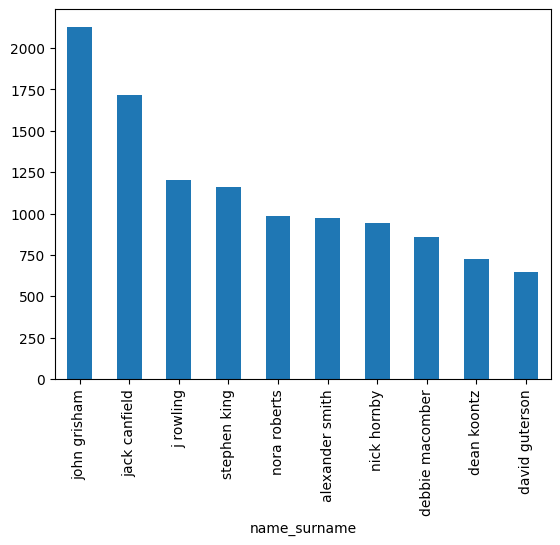

In [19]:
top_authors = all_cleaned['name_surname'].value_counts().head(10).plot(kind='bar')

In [20]:
# checking duplicates of author names

all_cleaned['surname'] = all_cleaned['name_surname'].apply(lambda x: x.split()[-1] if x.strip() else '')
#all_cleaned


# Group by surname and count unique names
surname_counts = all_cleaned.groupby('surname')['name_surname'].value_counts().sort_values(ascending=False)
print(surname_counts)

surname      name_surname       
grisham      john grisham           2128
canfield     jack canfield          1719
rowling      j rowling              1205
king         stephen king           1160
roberts      nora roberts            984
                                    ... 
monastyrsky  michael monastyrsky       1
fabio        fabio                     1
             anthony di fabio          1
moncalvo     gigi moncalvo             1
knight       erika knight              1
Name: count, Length: 32391, dtype: int64


In [21]:
# save data to csv
all_cleaned.to_csv('data/all_cleaned.csv', index=False) 